# 1. Data Description

- NIPS Conference Papers 1987-2015 Data Set
- 11463 x 5812 matrix of word counts, containing 11463 words and 5811 NIPS conference papers

# 2. Explortory Data Analysis (EDA)

In [115]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import colors
import six
plt.style.use('seaborn-poster')
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud

In [2]:
colors_ = list(six.iteritems(colors.cnames))
# Transform to hex color values.
color_list = ['teal', 'tomato', 'blue', 'sienna', 'plum', 'red', 'yellowgreen', 'khaki']
marker_list = ["o", "v", "^", "<", ">", "p", "D","*","s", "D", "p"]

In [3]:
data_df = pd.read_csv('NIPS_1987-2015.csv', index_col = 0).T.astype(np.float)

In [4]:
data_df.head()

,abalone,abbeel,abbott,abbreviate,abbreviated,abc,abeles,abernethy,abilistic,abilities,...,zhou,zhu,zien,zilberstein,zones,zoo,zoom,zou,zoubin,zurich
1987_1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1987_2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1987_3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1987_4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1987_5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### 2.1 Compute the average word count per paper for each year

In [5]:
data_df['YEAR'] = list(map(lambda x: np.int(x.split('_')[0]), data_df.index))
# Group to get average count for each year
word_by_year_df = data_df.groupby(by = 'YEAR').mean().T
# Get sorting creterion: average word count
word_by_year_df['AVE'] = word_by_year_df.mean(axis = 1)
# Sort by count
word_by_year_df.sort_values(by = 'AVE', axis = 0, ascending = False, inplace = True)
# Drop AVE column
word_by_year_df.drop(columns = 'AVE', inplace = True)

### 2.2 Eliminate stopwords

In [7]:
stopwords_set = set(stopwords.words('english'))
word_by_year_df = word_by_year_df.loc[list(filter(lambda x: x not in stopwords_set, word_by_year_df.index))]

### 2.3 Word count pattern

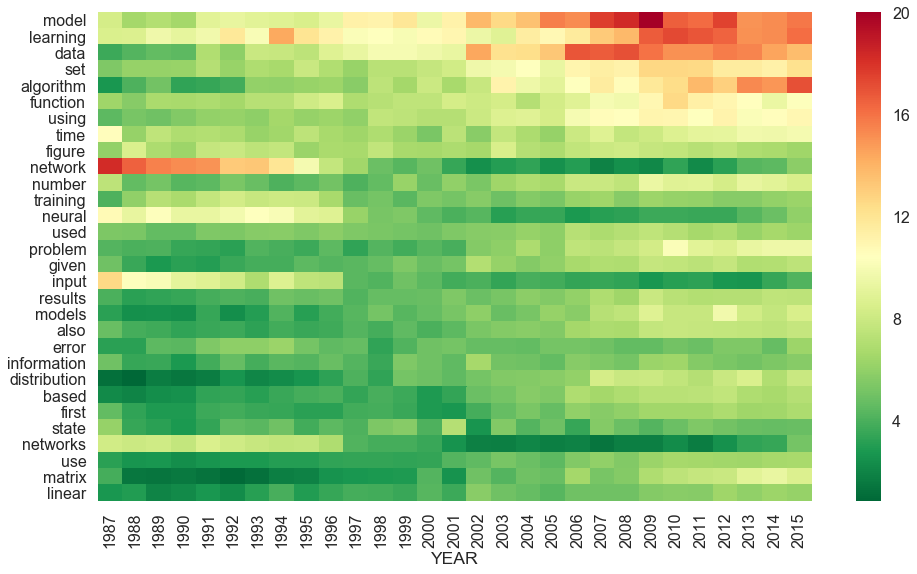

In [128]:
# select 30 most frequent words
word_by_year_selected_df = word_by_year_df[:30]
f, ax = plt.subplots(figsize=(16, 9))
sns.heatmap(word_by_year_selected_df, annot=False, ax=ax, cmap = 'RdYlGn_r', yticklabels=1)
plt.show()

##### As shown in the above plot, word counts show some clear patterns through years: 
- Network and networks were frequently mentioned before 1995 but rarely studied recently. 
- Since 2000, lots of attention has been given to model, learning, data and algorithms. 

### 2.4 Ploting the trend

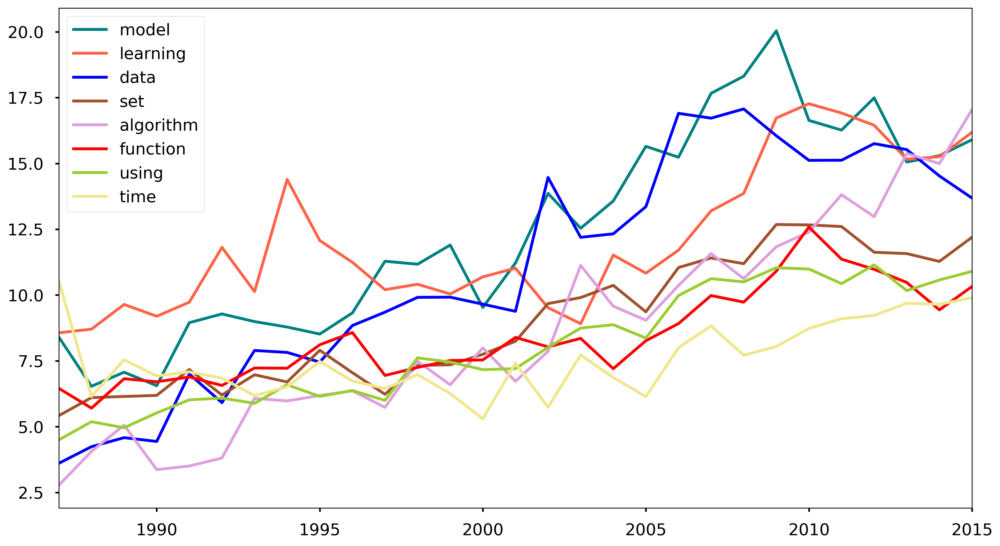

In [9]:
plt.figure(num=None, figsize=(16, 9), dpi=300, facecolor='w', edgecolor='k')
for i in range(8):
    plt.plot(word_by_year_df.iloc[i], color = color_list[i % 8], label = word_by_year_df.index[i])
plt.legend(loc = 2)
plt.xlim([word_by_year_df.columns[0], word_by_year_df.columns[-1]])
plt.show()

##### The above plot shows an obvious trend of increase in data, model and learning. 

### 2.5 Word Cloud

In [10]:
def generate_text_for_wordcloud(word_list, count_list):
    tmp_dict = dict()
    for i in range(len(word_list)):
        if type(word_list[i]) == str:
            tmp_dict[word_list[i]] = count_list[i]
    return tmp_dict

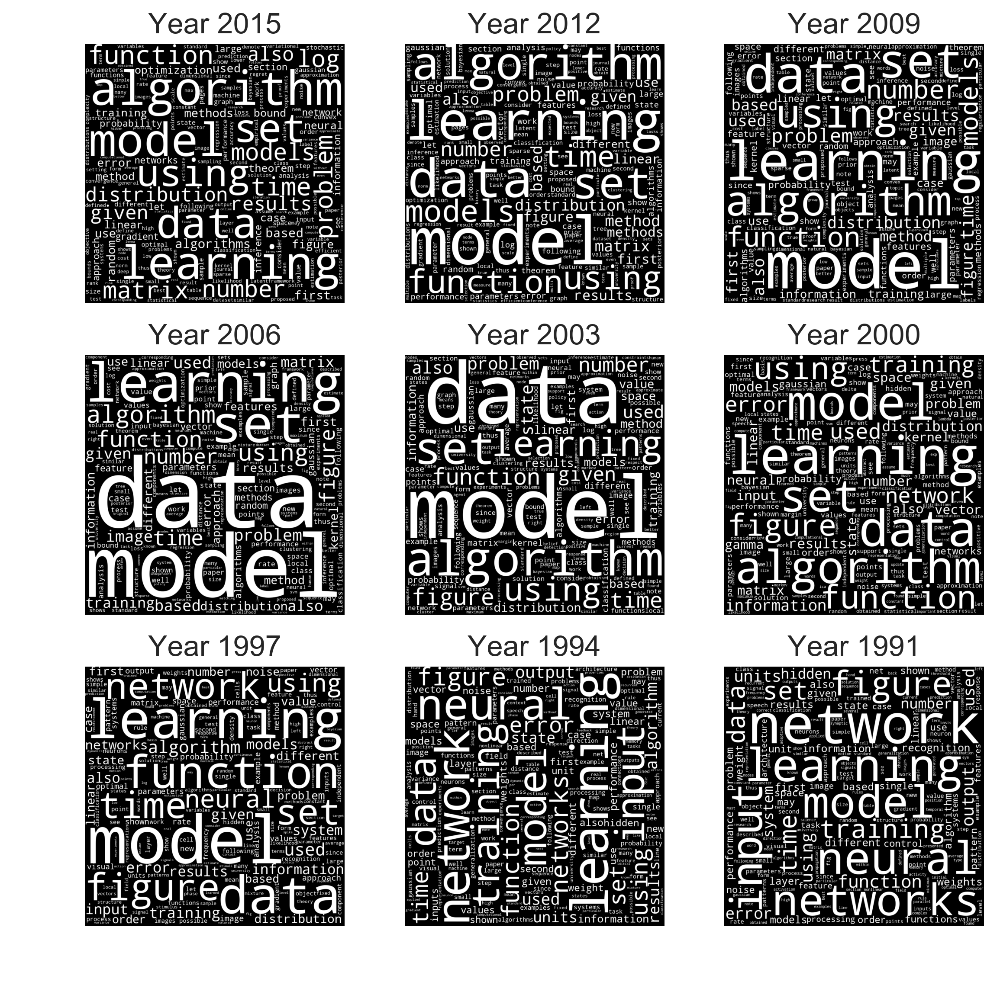

In [134]:
fig, axes = plt.subplots(3, 3, sharex=True,  sharey=True, figsize=(9, 9), dpi=300)
axes = axes.flatten()
largest_year = word_by_year_df.columns[-1]
for i in range(len(axes)):
    wordcloud = WordCloud(width=960, height=960, color_func=lambda *args, **kwargs: (255,255,255)).generate_from_frequencies(generate_text_for_wordcloud(word_by_year_df.index.tolist(), 
                                                                 word_by_year_df[largest_year - i*3].tolist()))
    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis("off")
    axes[i].set_title('Year ' + str(largest_year - i*3), fontsize = 16)
plt.show()

# 3. Clustering

In [16]:
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import make_pipeline

from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist as dist
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

### 3.1 Feature

In [48]:
data_df = data_df.drop(columns='YEAR')
# convert from word count to tf-idf 
tfidf = TfidfTransformer().fit_transform(data_df)
# dimension reduction through lsa
svd = TruncatedSVD(100)
normalizer = Normalizer(copy=False)
lsa = make_pipeline(svd, normalizer)

X = lsa.fit_transform(tfidf)

### 3.2 k Means: Elbow Method for selecting k

In [39]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import calinski_harabaz_score

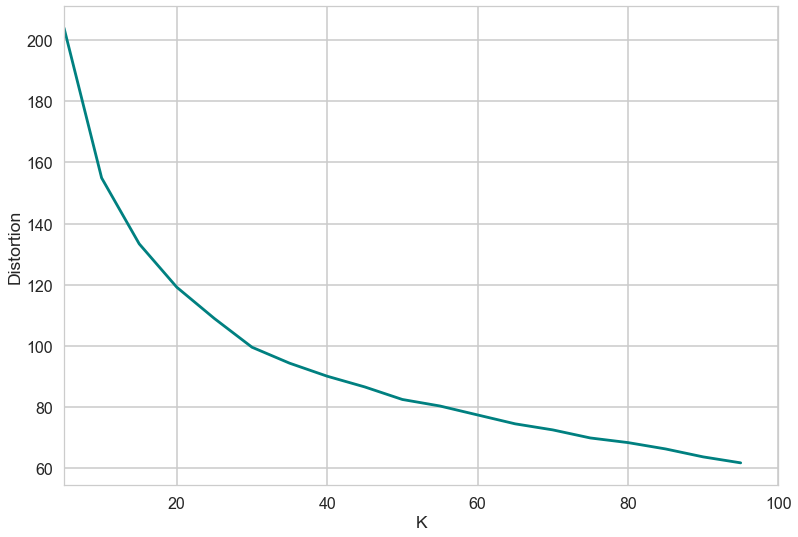

In [125]:
# use elbow method to select k value
distortions = []
K = range(5,100,5)
for k in K:
    cluster = KMeans(n_clusters=k, init='k-means++')
    cluster.fit(X.copy())
    distortions.append(calinski_harabaz_score(X, cluster.labels_))

# Plot the elbow
# plt.figure(num=None, figsize=(4, 3), dpi=300, facecolor='w', edgecolor='k')
plt.plot(K, distortions, color = color_list[0], label = 'Distortion')
plt.xlabel("K")
plt.ylabel("Distortion")
plt.xlim([5, 100])
plt.show()

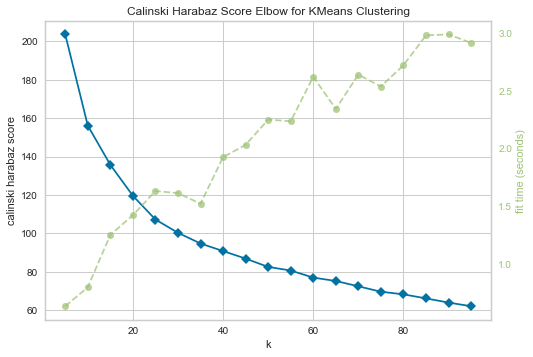

In [49]:
# check the above work with yellowbrick visulizer
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k= range(5,100, 5),  metric = 'calinski_harabaz')

visualizer.fit(X)    # Fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data

##### As shown in the above two plots, distortion decreases rapidlly as k increases towards 25 and the decrease of distortion slows down when k is larger than 25. Therefore, based on the plot of Elbow Method, select 25 as the number of clusters for this task. 

In [51]:
K = 25

In [52]:
cluster = KMeans(n_clusters=K, init='k-means++')
cluster.fit(X)
y = cluster.labels_

### 3.3 Visualize the clusters

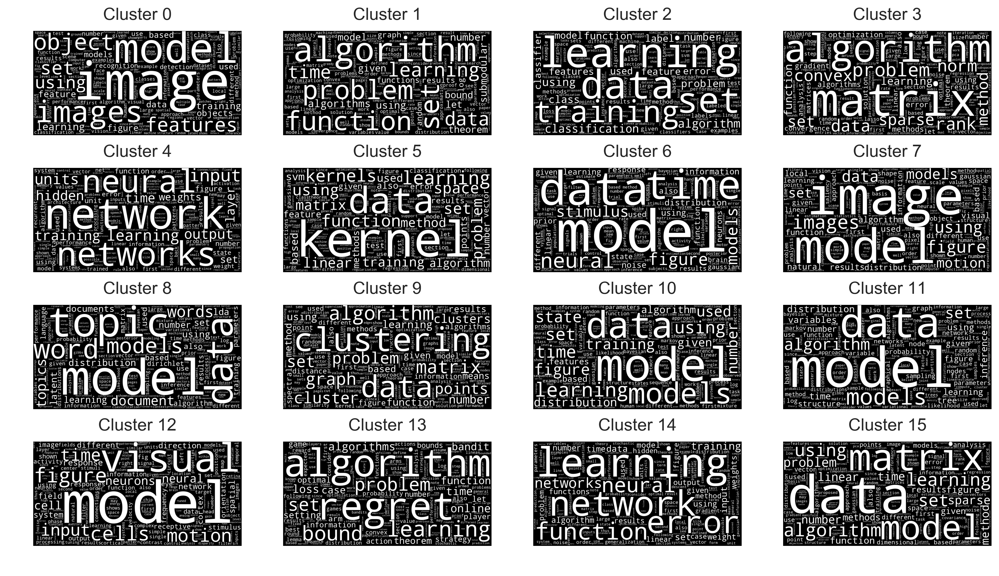

In [45]:
fig, axes = plt.subplots(4, 4, sharex=True,  sharey=True, figsize=(16, 9), dpi=300)
axes = axes.flatten()
selected_indices = np.random.choice(K, len(axes), replace = False)
for i in range(len(axes)):
    ave_temp = data_df[y==selected_indices[i]].mean(axis=0)
    wordcloud = WordCloud(width=960, height=480, color_func=lambda *args, **kwargs: (255,255,255)).generate_from_frequencies(ave_temp)
    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis("off")
    axes[i].set_title('Cluster ' + str(i), fontsize = 16)
plt.show()

##### The above visualization shows 12 randomly selected clusters from the 25 clusters obtained. 
##### The word cloud of each cluster shows some unique features. For example, cluster 7 groups papers on image, figure, and motions, and cluster 4 groups papers using neural network models. 

# 4. Classification

In [55]:
# train-test split 
# test data will be saved for final evaluation.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

### 4.1 Random Forests

In [142]:
rf_scores_list = []
# cross validation for comparison between different n_estimators
for i in range(10, 300, 10):
    clf = RandomForestClassifier(n_estimators=i, max_depth=2,random_state=0)
    scores_clf = cross_val_score(clf, X_train, y_train, cv=5)
    rf_scores_list.append(np.mean(scores_clf))

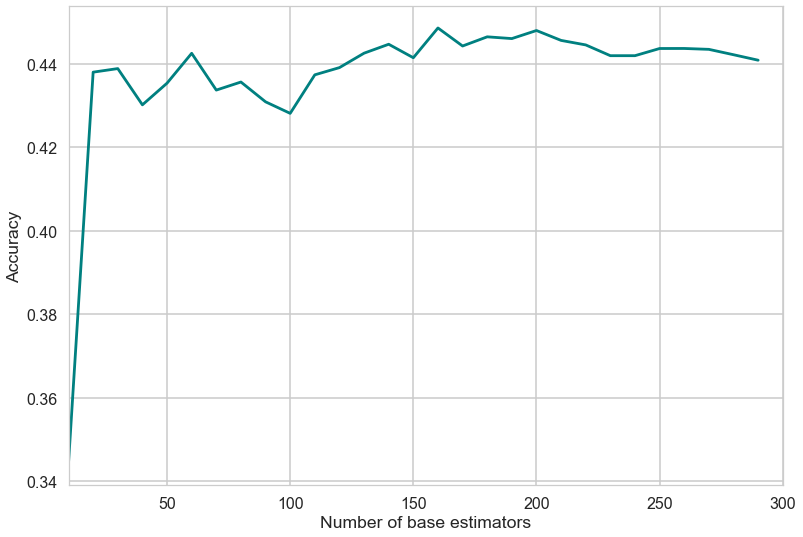

In [143]:
plt.plot(range(10, 300, 10), rf_scores_list, color = color_list[0], label = 'Accuracy')
plt.xlabel("Number of base estimators")
plt.ylabel("Accuracy")
plt.xlim([10, 300])
plt.show()

##### The overall accuracy of random forests is around 44%. This model does not look promising and therefore no further tuning will be performed on this model. 

### 4.2 k-Nearest Neighbors

In [152]:
knn_scores_list = []
# cross validation for comparison of different n_neighbors
for i in range(1,100, 3):
    knn = KNeighborsClassifier(n_neighbors=i)
    scores_knn_para = cross_val_score(knn, X_train, y_train, cv=5)
    knn_scores_list.append(np.mean(scores_knn_para))

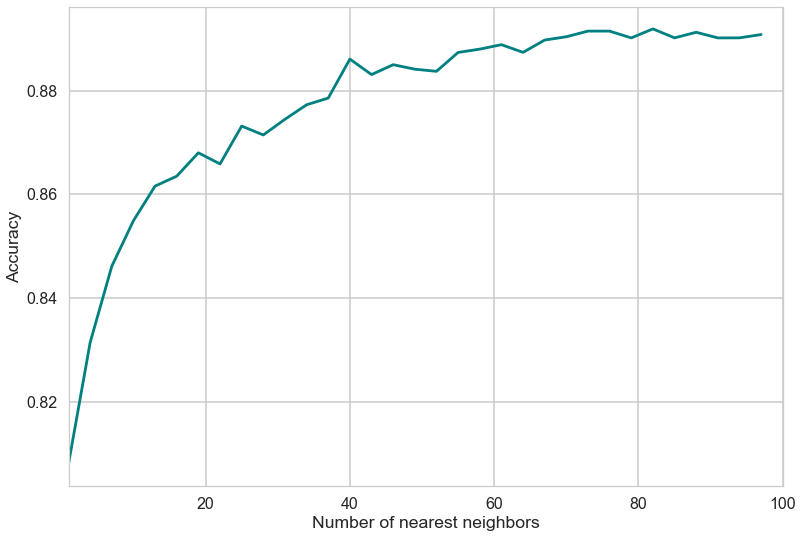

In [153]:
plt.plot(range(1, 100, 3), knn_scores_list, color = color_list[0], label = 'Accuracy')
plt.xlabel("Number of nearest neighbors")
plt.ylabel("Accuracy")
plt.xlim([1, 100])
plt.show()

##### Based on the above plot, select 55 n_neighbors for this knn classification model.

### 4.3 Neural Networks

In [93]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import Dataset
from sklearn.metrics import accuracy_score

In [58]:
class MyDataset(Dataset):
    def __init__(self, data, target, transform=None):
        self.data = torch.from_numpy(data).float()
        self.target = torch.from_numpy(target).long()
        self.transform = transform
        
    def __getitem__(self, index):
        x = self.data[index]
        y = self.target[index]
        
        if self.transform:
            x = self.transform(x)
        return x, y
    
    def __len__(self):
        return len(self.data)

In [59]:
# further split train set into train and validation to nn training
X_t, X_val, y_t, y_val = train_test_split(X_train, y_train, test_size=0.33)
# construct train and validation set and data loader
trainset = MyDataset(X_t, y_t)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=52, shuffle=True, num_workers=2)
valset = MyDataset(X_val, y_val)
valloader = torch.utils.data.DataLoader(valset, batch_size=len(valset), shuffle=False, num_workers=2)

In [119]:
# construct a simple neural network with three dense layers
class NN(nn.Module):
    def __init__(self):
        super(NN, self).__init__()
        self.fc1 = nn.Linear(100, 32)
        self.fc2 = nn.Linear(32, 16)
        self.fc3 = nn.Linear(16, 25)

    def forward(self, x):
        return self.fc3(F.relu(self.fc2(F.relu(self.fc1(x)))))

model = NN()

In [120]:
criterion = nn.CrossEntropyLoss(size_average = False)
optimizer = optim.Adam(model.parameters(), lr=0.05)

In [121]:
train_accu = []
val_accu = []

for epoch in range(100):  # loop over the dataset multiple times
    y_t_pred_list = []
    y_t_true_list = []
    train_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs
        inputs = Variable(data[0])
        labels = Variable(data[1])
        # zero the parameter gradients
        optimizer.zero_grad()
        # forward + backward + optimize
        train_outputs = model(inputs)
        loss = criterion(train_outputs, labels)
        loss.backward()
        optimizer.step()
        
        # calculate training accuracy
        train_loss += loss.data[0]
        y_t_pred = np.argmax(train_outputs.data.numpy(), axis = 1).astype(np.int).tolist()
        y_t_pred_list += y_t_pred
        y_t_true_list += data[1].numpy().flatten().tolist()
    train_accuracy = accuracy_score(y_t_true_list, y_t_pred_list)
    # pass through validation set
    val_inputs = Variable(list(valloader)[0][0])
    val_labels = Variable(list(valloader)[0][1])
    val_outputs = model(val_inputs)
    # calculate validation accuracy
    val_loss = criterion(val_outputs, val_labels)
    y_val_pred = np.argmax(val_outputs.data.numpy(), axis = 1).astype(np.int)
    val_accuracy = accuracy_score(y_val, y_val_pred)
#     print("Epoch {}, train loss {}, train acc {}, val loss {}, val acc {}".format(
#            epoch, train_loss/len(y_train), train_accuracy, val_loss.data[0]/len(y_val), val_accuracy))
    train_accu.append(train_accuracy)
    val_accu.append(val_accuracy)

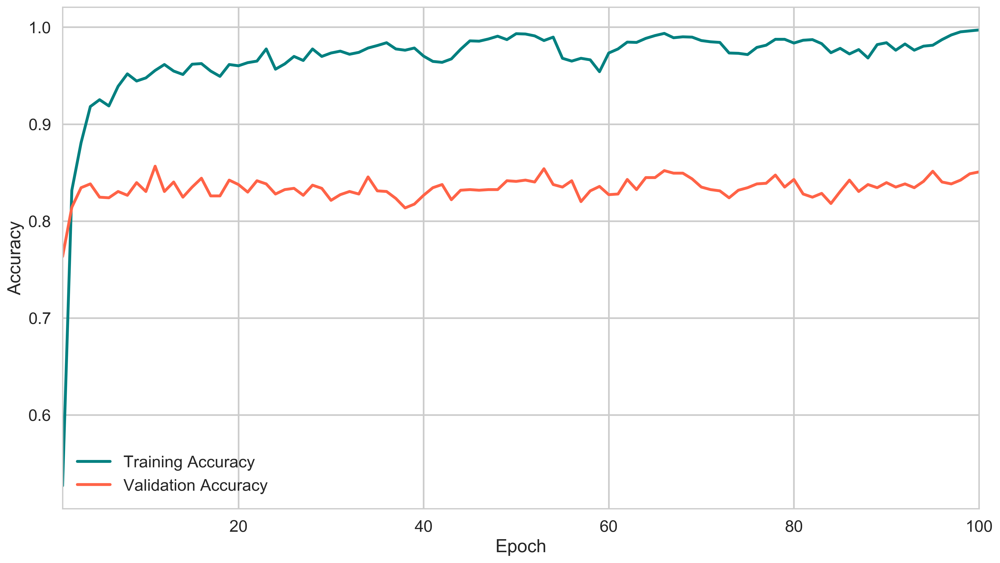

In [122]:
plt.figure(num=None, figsize=(16, 9), dpi=300, facecolor='w', edgecolor='k')
plt.plot(range(1, 101), train_accu, color = color_list[0], label = 'Training Accuracy')
plt.plot(range(1, 101), val_accu, color = color_list[1], label = 'Validation Accuracy')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend(loc = 3)
plt.xlim([1, 100])
plt.show()

##### The above plot shows severe overfitting. The neural network model is too complex for the 5k*10k input matrix.  

# 5. Evaluation

##### Compared to random forests and neural network classification model, knn model shows higher validation accuracy and is more robust for this particular dataset.

In [155]:
knn = KNeighborsClassifier(n_neighbors=60)
knn.fit(X_train, y_train)
accuracy = knn.score(X_test, y_test)

In [156]:
accuracy

0.89853826311263973

##### Using a knn classifier with n_neighbors selected as 60, the testing accuracy is 89.9%.